In [11]:
# Importing packages
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import sklearn
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

#import tensorflow as tf

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing
from arch import arch_model

import pmdarima as pm
import pylab

import scipy.fft
from scipy.fft import fft, fftfreq, ifft,  rfft, rfftfreq
from scipy import stats
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

import seaborn as sns
sns.set_style('darkgrid')

from datetime import timedelta

#import tensorflow as tf
#keras = tf.keras

%matplotlib inline 
#notebook

In [12]:
# Reading pvwatt data
df = pd.read_csv("../dataset/pvwatts_hourly.csv", skiprows=30)
df.head(5)

,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W)
0,1,1,0,0,0,16.0,0.5,0.27,0.0,16.0,0.0,0.0
1,1,1,1,0,0,15.6,2.1,0.27,0.0,15.6,0.0,0.0
2,1,1,2,0,0,15.1,2.1,0.27,0.0,15.1,0.0,0.0
3,1,1,3,0,0,14.8,2.1,0.27,0.0,14.8,0.0,0.0
4,1,1,4,0,0,14.4,1.0,0.27,0.0,14.4,0.0,0.0


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Month                              8760 non-null   int64  
 1   Day                                8760 non-null   int64  
 2   Hour                               8760 non-null   int64  
 3   Beam Irradiance (W/m2)             8760 non-null   int64  
 4   Diffuse Irradiance (W/m2)          8760 non-null   int64  
 5   Ambient Temperature (C)            8760 non-null   float64
 6   Wind Speed (m/s)                   8760 non-null   float64
 7   Albedo                             8760 non-null   float64
 8   Plane of Array Irradiance (kW/m2)  8760 non-null   float64
 9   Cell Temperature (C)               8760 non-null   float64
 10  DC Array Output (W)                8760 non-null   float64
 11  AC System Output (W)               8760 non-null   float

In [14]:
df.describe()

,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,6.526027,15.720548,11.500000,261.977397,69.260731,27.135297,3.644521,0.241479,268.960170,31.379833,1684.112963,1608.241745
std,3.448048,8.796749,6.922582,343.125973,88.571262,7.394359,2.252985,0.025772,356.446872,12.609671,2216.293048,2125.999656
min,1.000000,1.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.190000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,8.000000,5.750000,0.000000,0.000000,21.500000,2.100000,0.210000,0.000000,22.399750,0.000000,0.000000
50%,7.000000,16.000000,11.500000,0.000000,10.000000,27.000000,3.100000,0.250000,9.248000,29.805000,35.860000,2.880500
75%,10.000000,23.000000,17.250000,605.000000,132.000000,32.500000,5.100000,0.260000,582.445750,39.314250,3783.695250,3617.915750
max,12.000000,31.000000,23.000000,975.000000,538.000000,47.000000,24.200000,0.270000,1077.771000,77.531000,6897.414000,6621.303000


In [15]:
# Adding year column and datetime column
df['year'] = 2022
#df['datetime'] = pd.to_datetime(year = '2022', month = 'Month', day = 'Day', hour = 'Hour')
df['datetime'] = pd.to_datetime(df[['year', 'Month', 'Day', 'Hour']])
#df = df.set_index(['datetime'])
df.head(4)

,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W),year,datetime
0,1,1,0,0,0,16.0,0.5,0.27,0.0,16.0,0.0,0.0,2022,2022-01-01 00:00:00
1,1,1,1,0,0,15.6,2.1,0.27,0.0,15.6,0.0,0.0,2022,2022-01-01 01:00:00
2,1,1,2,0,0,15.1,2.1,0.27,0.0,15.1,0.0,0.0,2022,2022-01-01 02:00:00
3,1,1,3,0,0,14.8,2.1,0.27,0.0,14.8,0.0,0.0,2022,2022-01-01 03:00:00


In [16]:
df.columns

Index(['Month', 'Day', 'Hour', 'Beam Irradiance (W/m2)',
       'Diffuse Irradiance (W/m2)', 'Ambient Temperature (C)',
       'Wind Speed (m/s)', 'Albedo', 'Plane of Array Irradiance (kW/m2)',
       'Cell Temperature (C)', 'DC Array Output (W)', 'AC System Output (W)',
       'year', 'datetime'],
      dtype='object')

In [17]:
var_cals_list = ['Beam Irradiance (W/m2)',
       'Diffuse Irradiance (W/m2)', 'Ambient Temperature (C)',
       'Wind Speed (m/s)', 'Albedo', 'Plane of Array Irradiance (kW/m2)',
       'Cell Temperature (C)', 'DC Array Output (W)', 'AC System Output (W)']
for col in var_cals_list:
    fig = px.line(df, x = 'datetime', y = col, title= str(col) + "days")
    fig.show()

## Hourly Analysis

In [18]:
# create scatter plot with subplots using Plotly Express
for col in var_cals_list :
    fig = px.line(df, x='datetime', y=col, color='Hour', facet_col='Hour', title='Subplots of '+str(col)+ ' Grouped Data')
    fig
    # show plot
    fig.show()

<Figure size 640x480 with 0 Axes>

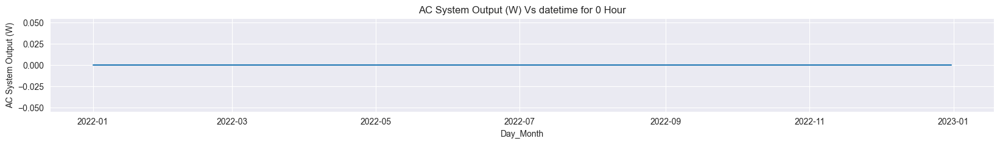

<Figure size 640x480 with 0 Axes>

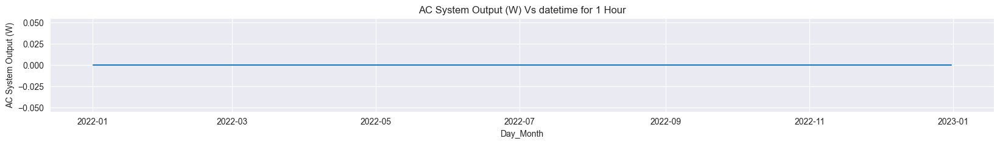

<Figure size 640x480 with 0 Axes>

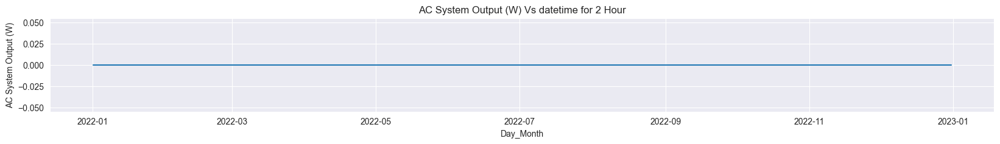

<Figure size 640x480 with 0 Axes>

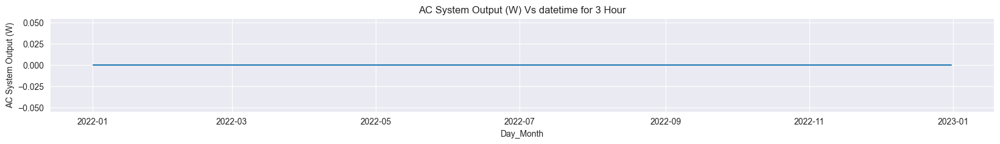

<Figure size 640x480 with 0 Axes>

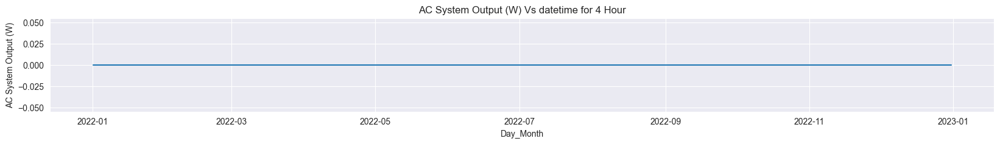

<Figure size 640x480 with 0 Axes>

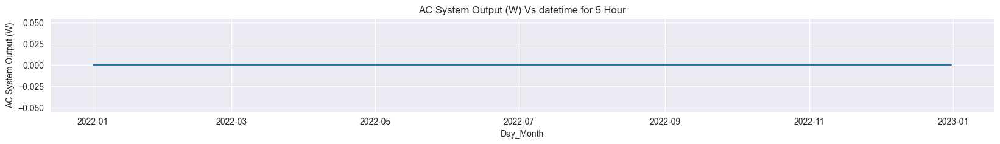

<Figure size 640x480 with 0 Axes>

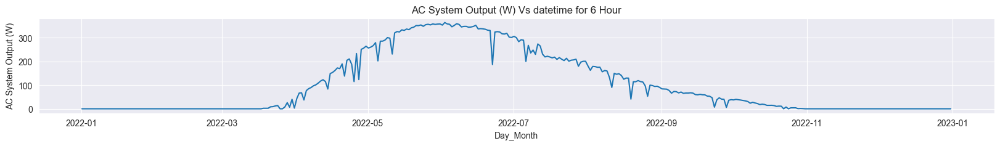

<Figure size 640x480 with 0 Axes>

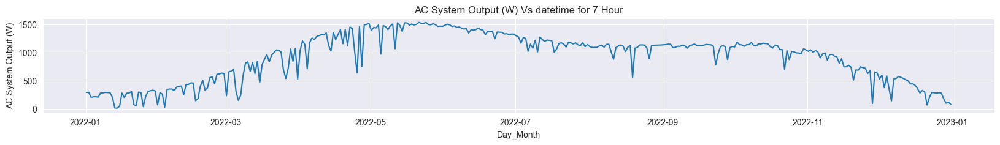

<Figure size 640x480 with 0 Axes>

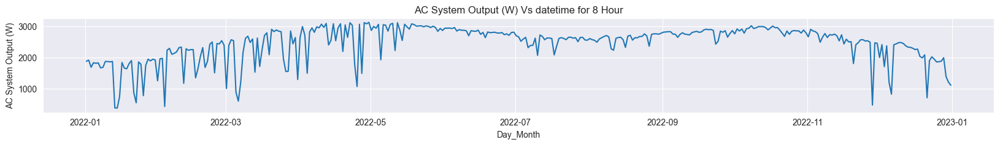

<Figure size 640x480 with 0 Axes>

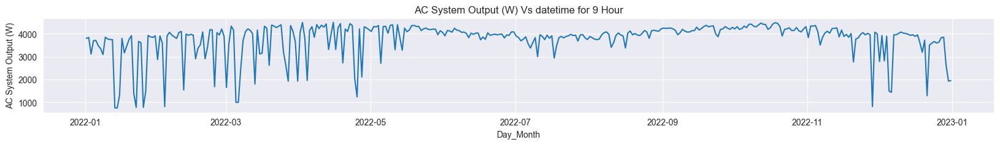

<Figure size 640x480 with 0 Axes>

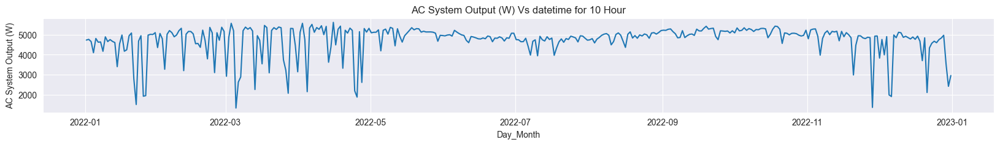

<Figure size 640x480 with 0 Axes>

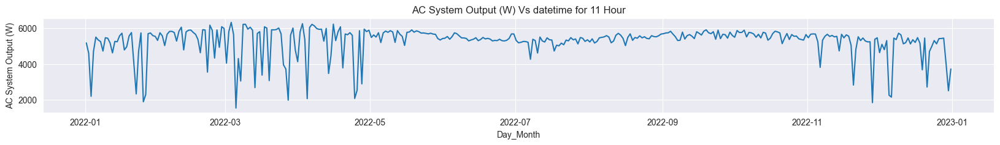

<Figure size 640x480 with 0 Axes>

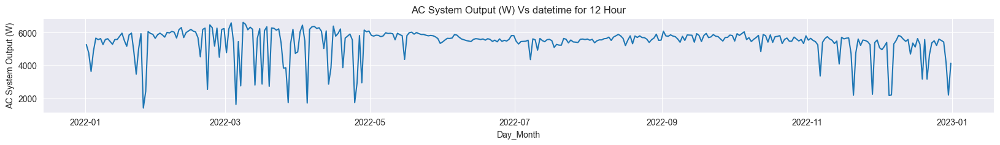

<Figure size 640x480 with 0 Axes>

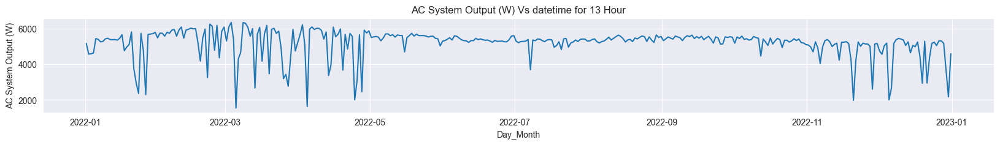

<Figure size 640x480 with 0 Axes>

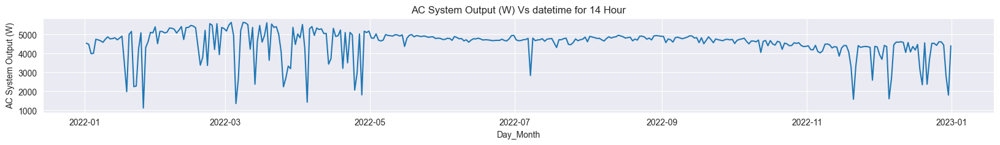

<Figure size 640x480 with 0 Axes>

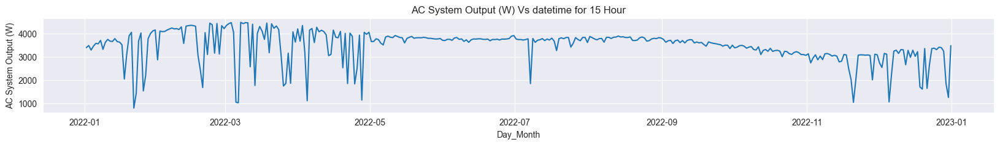

<Figure size 640x480 with 0 Axes>

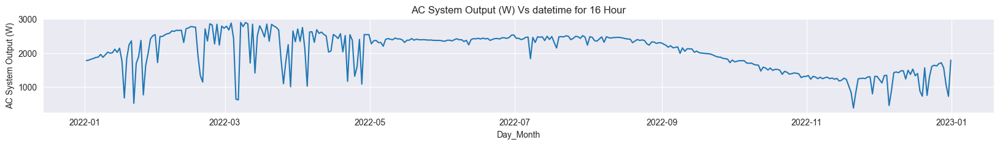

<Figure size 640x480 with 0 Axes>

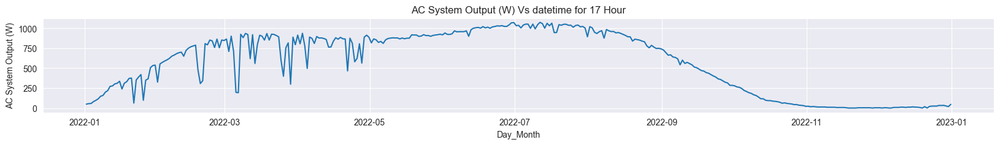

<Figure size 640x480 with 0 Axes>

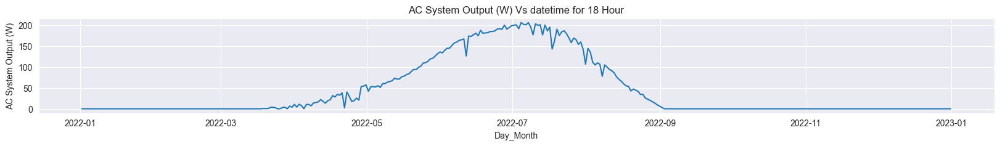

<Figure size 640x480 with 0 Axes>

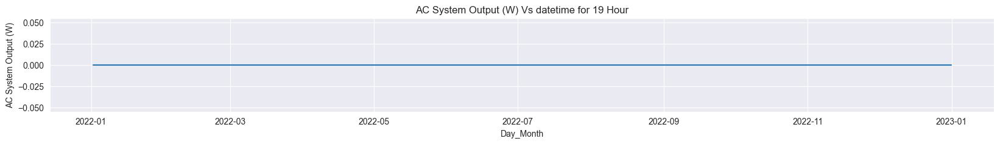

<Figure size 640x480 with 0 Axes>

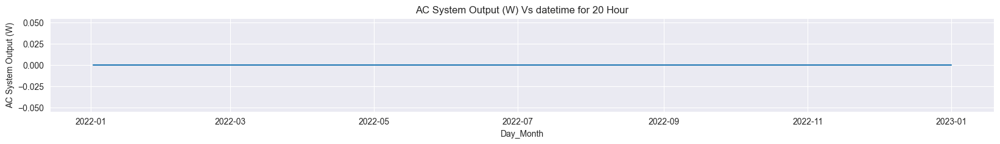

<Figure size 640x480 with 0 Axes>

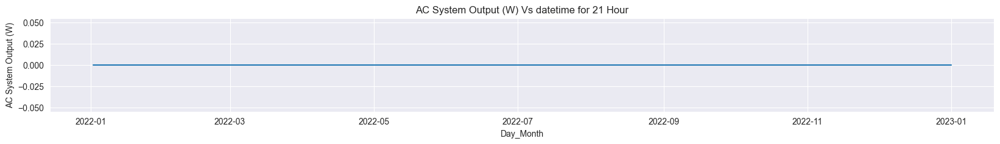

<Figure size 640x480 with 0 Axes>

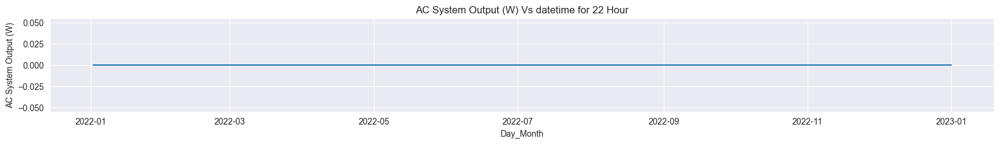

<Figure size 640x480 with 0 Axes>

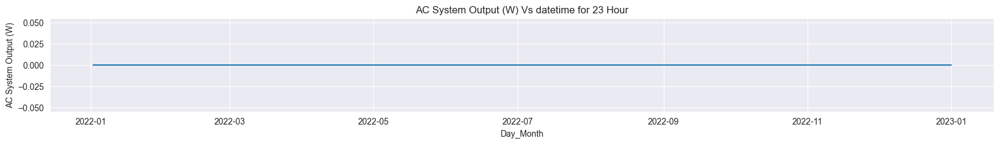

In [19]:
for hr, df_hr in enumerate(df.groupby('Hour')):
    plt.figure()
    fig = plt.figure(figsize=(20, 2))
    plt.plot(df_hr[1]['datetime'], df_hr[1]['AC System Output (W)'])
    plt.xlabel('Day_Month')
    plt.ylabel("AC System Output (W)")
    plt.title("AC System Output (W) Vs datetime for "+ str(hr) + " Hour")
    plt.show()

### ACF and PACF correlation a

/Users/harshayarravarapu/Library/Python/3.9/lib/python/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



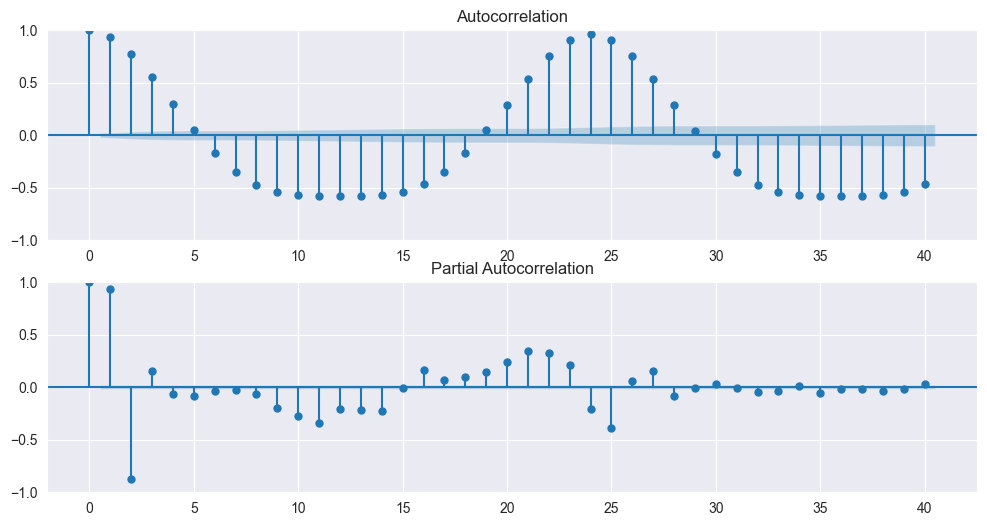

In [20]:
# ACF and PACF plots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,6))
plot_acf(df['DC Array Output (W)'], ax=ax1)
plot_pacf(df['DC Array Output (W)'], ax=ax2)

plt.show()

### One Lag Time Differencing

<AxesSubplot: >

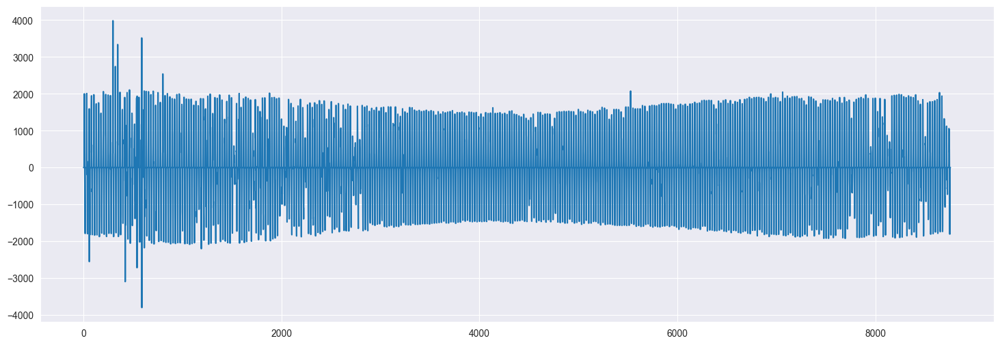

In [36]:
df_diff=df['DC Array Output (W)'] - df['DC Array Output (W)'].shift()
df_diff.plot()

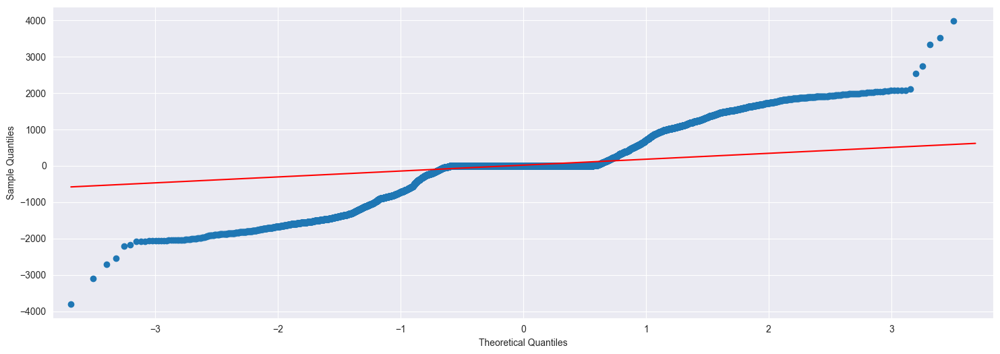

In [37]:
sm.qqplot(df_diff, line='q');

### High auto-correlation value is observed for lag 1 and lag 24 in ACF plot
### Significant Partial auto correlation for lags 1,2,25 in PACF plots

## Checking Stationarity of time series
### A Stationary series is one whose statistical properties such as mean, variance, covariance, and standard deviation do not vary with time, or these stats properties are not a function of time. In other words, stationarity in Time Series also means series without a Trend or Seasonal components

In [21]:
# Call the function and run the test
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

adf_test(df['DC Array Output (W)'])    

## Hypothesis is Time series is stationary
### p-value > 0.05 : Fail to reject the null hypothesis of the statistical test. => Time series is stationary
### p-value <= 0.05 : Reject the null hypothesis of the statistical test. => Time series is non-stationary



# Seasonal Decomposition
### y(t) = trend + seasonality + residual(noise) -> additive trend
### y(t) = trend*seasonality*residual -> Multiplicative trend

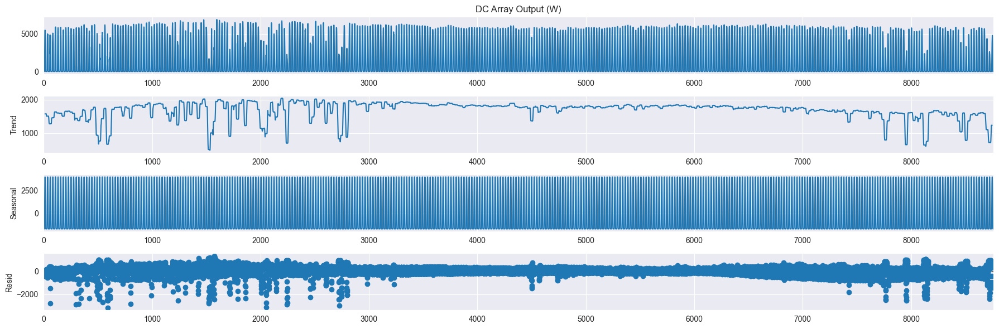

In [35]:
#Seaosnal decomposition
def seasonal_decomposition(series, model_type, period):
    results = seasonal_decompose(series, model = model_type, period = period)
    plt.rcParams["figure.figsize"] = (18, 6)
    results.plot()
    plt.show()

seasonal_decomposition(df['DC Array Output (W)'], model_type = 'additive', period = 24)

## Working with one specific hour time series and for DC Array Output (W) as target
### Consider "12:00" hr timeseries

In [ ]:
ts = df[df['Hour'] == 12]
ts.shape

(365, 14)

In [ ]:
ts.head(4)

,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W),year,datetime
12,1,1,12,843,116,24.8,1.0,0.27,890.980,52.040,5489.937,5263.698,2022,2022-01-01 12:00:00
36,1,2,12,545,241,23.0,3.6,0.27,761.406,37.005,4967.884,4760.144,2022,2022-01-02 12:00:00
60,1,3,12,228,348,24.3,6.2,0.27,574.225,31.842,3791.327,3625.277,2022,2022-01-03 12:00:00
84,1,4,12,553,240,23.2,6.2,0.27,768.246,33.311,5085.171,4873.274,2022,2022-01-04 12:00:00


<Figure size 56000x400 with 0 Axes>

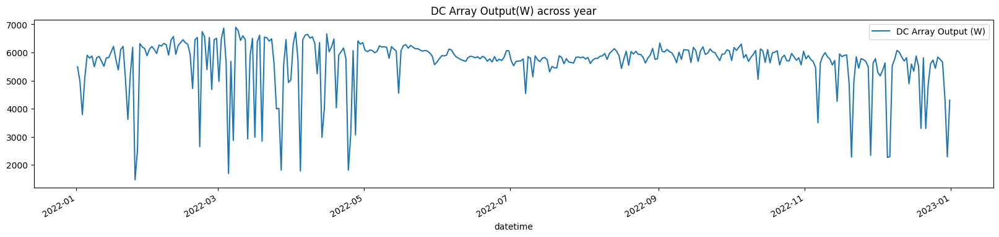

In [ ]:
# Line Plot the DC output 
ts.plot(x = 'datetime', y = 'DC Array Output (W)', title = "DC Array Output(W) across year", figsize = (20,4))
plt.show()

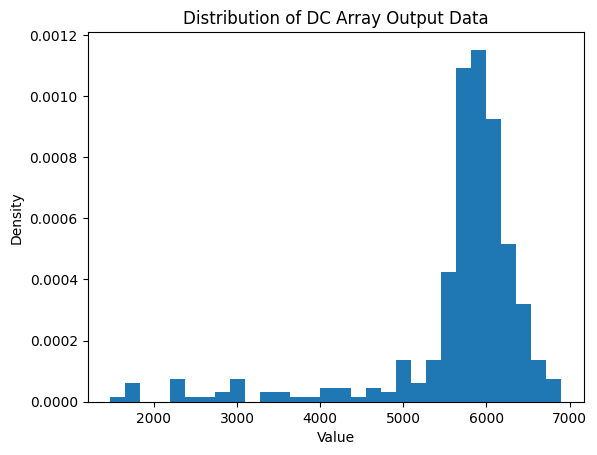

In [ ]:
# Distribution plot 
# Plot a histogram of the data
plt.hist(ts['DC Array Output (W)'], bins=30, density=True)
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Distribution of DC Array Output Data')
plt.show()

In [ ]:
fig = px.histogram(ts['DC Array Output (W)'], nbins=30, histnorm='density')

# Add labels and a title
fig.update_layout(xaxis_title='Value', yaxis_title='Density', title='Distribution of DC Array Output Data')

# Show the plot
fig.show()

In [ ]:
hist_data = [ts['DC Array Output (W)']]
group_labels = ['distplot'] # name of the dataset

fig = ff.create_distplot(hist_data, group_labels)
fig.show()

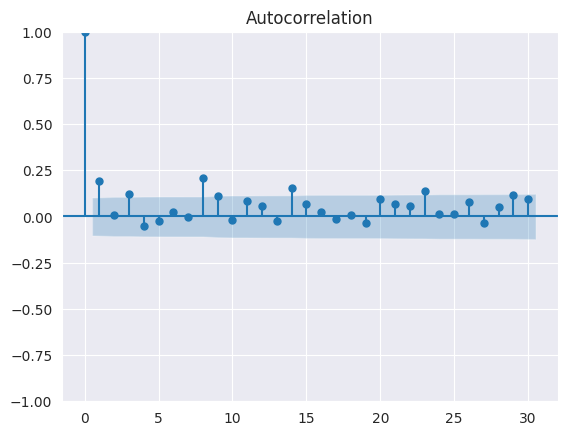

In [ ]:
plot_acf(ts['DC Array Output (W)'], lags=30);

/home/local/ASUAD/hyarrava/.local/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



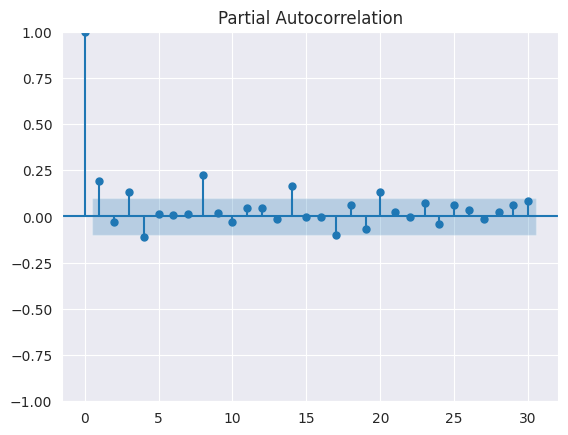

In [ ]:
plot_pacf(ts['DC Array Output (W)'], lags=30);

# First series difference

In [ ]:
ts['1st_diff'] = ts['DC Array Output (W)'] - ts['DC Array Output (W)'].shift(1)
ts

,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W),year,datetime,1st_diff
12,1,1,12,843,116,24.8,1.0,0.27,890.980,52.040,5489.937,5263.698,2022,2022-01-01 12:00:00,NaN
36,1,2,12,545,241,23.0,3.6,0.27,761.406,37.005,4967.884,4760.144,2022,2022-01-02 12:00:00,-522.053
60,1,3,12,228,348,24.3,6.2,0.27,574.225,31.842,3791.327,3625.277,2022,2022-01-03 12:00:00,-1176.557
84,1,4,12,553,240,23.2,6.2,0.27,768.246,33.311,5085.171,4873.274,2022,2022-01-04 12:00:00,1293.844
108,1,5,12,856,113,22.8,4.6,0.27,901.867,37.209,5901.523,5660.700,2022,2022-01-05 12:00:00,816.352
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8652,12,27,12,885,99,26.8,3.6,0.21,899.966,43.383,5753.753,5518.166,2022,2022-12-27 12:00:00,-83.039
8676,12,28,12,730,162,22.4,9.3,0.21,842.985,30.694,5654.644,5422.569,2022,2022-12-28 12:00:00,-99.109
8700,12,29,12,375,289,21.7,7.2,0.21,650.012,29.406,4356.117,4170.054,2022,2022-12-29 12:00:00,-1298.527
8724,12,30,12,21,331,21.9,7.2,0.21,345.142,25.978,2294.054,2181.058,2022,2022-12-30 12:00:00,-2062.063


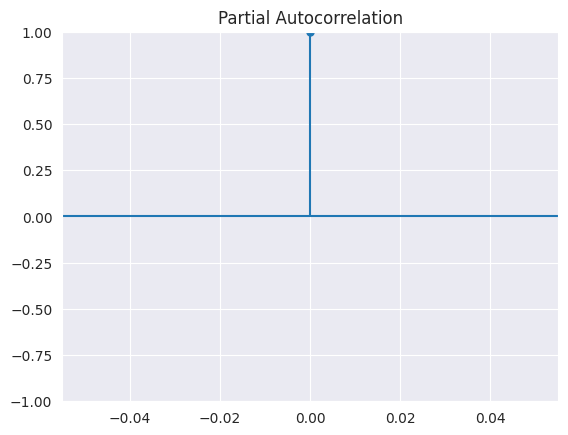

In [ ]:
plot_pacf(ts['1st_diff'], lags=1);

/home/local/ASUAD/hyarrava/.local/lib/python3.8/site-packages/matplotlib/axes/_base.py:2532: UserWarning:




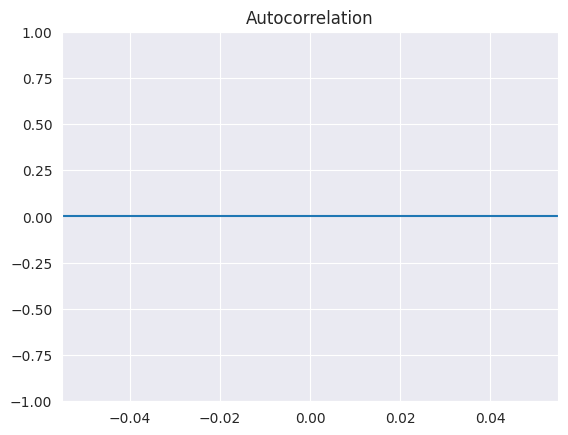

In [ ]:
plot_acf(ts['1st_diff'], lags=1);

<AxesSubplot: >

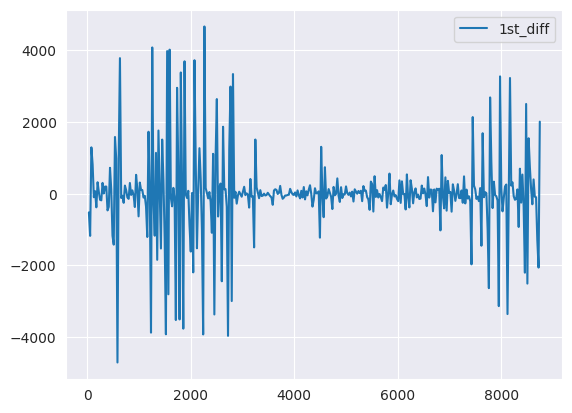

In [ ]:
# Is it a random walk?
diff=ts[['1st_diff']]
diff.plot()

In [ ]:
tsf=ts['DC Array Output (W)'].asfreq('b');
ts_dec=seasonal_decompose(tsf,  extrapolate_trend = 'freq')
ts_dec.trend.plot(color='r');
plt.show()

ValueError: This function does not handle missing values

In [ ]:
print(ts['DC Array Output (W)'].asfreq('b'))

1970-01-01 00:00:00.000000012   NaN
Freq: B, Name: DC Array Output (W), dtype: float64
